In [1]:
# Import libraries and custom functions
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import itertools

import gtsam
import gtsam.utils.plot

import utils

In [2]:
# Define plot image size
plt.rcParams['figure.figsize'] = (20, 12)

In [3]:
# Load images and convert to gray images
image_dir = 'data/test_buddha_images/'

# Gray image list
image_list = []
# Color image list
bgr_image_list = []

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

for image_file_name in sorted(os.listdir(image_dir), reverse=True):
    image = cv2.imread(image_dir+image_file_name)
    bgr_image_list.append(image.astype(int))
    # Convert color image into gray image
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply CLAHE to each image
    image = clahe.apply(image)
    image_list.append(image)
    
image_height, image_width = image_list[0].shape

# Assume camera intrinsic parameters
camera_matrix = np.array([[image_width, 0, image_width/2],
                          [0, image_width, image_height/2],
                          [0, 0, 1]])

In [4]:
# Evenly distribute the features across the image
def get_non_max_suppression_mask(keypoints):
    binary_image = np.zeros((image_height, image_width))
    response_list = np.array([keypoint.response for keypoint in keypoints])
    # Sort the feature points by response in descending order
    mask = np.flip(np.argsort(response_list))
    point_list = np.rint([keypoint.pt for keypoint in keypoints])[
        mask].astype(int)
    non_max_suppression_mask = []
    for point, index in zip(point_list, mask):
        if binary_image[point[1], point[0]] == 0:
            non_max_suppression_mask.append(index)
            # Mask out the pixels around the feature point,
            # to guarantee no more features are detected around it
            cv2.circle(binary_image, (point[0], point[1]), 3, 255, -1)

    return non_max_suppression_mask

In [5]:
# Detect keypoints and create descriptors of each images
sift = cv2.SIFT_create(nOctaveLayers=6)

keypoints_list = []
descriptors_list = []
# 3D object point list, same length of keypoint list
object_index_list = []

for image in image_list:
    keypoints, descriptors = sift.detectAndCompute(image, None)
    # Get the mask of the remaining feature points after the non-max-suppression
    non_max_suppression_mask = get_non_max_suppression_mask(keypoints)

    keypoints_list.append(np.array(keypoints)[non_max_suppression_mask])
    descriptors_list.append(np.array(descriptors)[non_max_suppression_mask])
    
    # Initialize the 3D object point with -1
    object_index_list.append(np.full(len(keypoints), -1, int))

In [6]:
# Match the keypoints across 2 images
bf_matcher = cv2.BFMatcher(cv2.NORM_L2)


def get_match_points(src_keypoints, src_descriptors, dst_keypoints, dst_descriptors):
    
    # match from src image to dst image, keep top 2 matches for Lowe's ratio check
    matches = bf_matcher.knnMatch(src_descriptors, dst_descriptors, k=2)
    
    # match from dst image to src image
    cross_matches = bf_matcher.match(dst_descriptors, src_descriptors)
    
    # Cross match dictionary to check cross matches
    cross_match_dict = {}
    for cross_match in cross_matches:
        cross_match_dict[cross_match.trainIdx] = cross_match.queryIdx

    src_points = []
    dst_points = []
    src_point_index_list = []
    dst_point_index_list = []

    for match_1, match_2 in matches:
        # Lowe's ratio check
        # Note that I didn't do cross match in this program!
        # Lowe's ratio is good enough in this dataset
        if match_1.distance < 0.75*match_2.distance:
            src_points.append(src_keypoints[match_1.queryIdx].pt)
            dst_points.append(dst_keypoints[match_1.trainIdx].pt)
            src_point_index_list.append(match_1.queryIdx)
            dst_point_index_list.append(match_1.trainIdx)

    return np.array(src_points), np.array(dst_points), np.array(src_point_index_list), np.array(dst_point_index_list)

In [7]:
# Recover pose from matching points
def get_rotation_translation_index_mask(dst_points, src_points):
    essential_matrix, essential_mask = cv2.findEssentialMat(
        dst_points, src_points, camera_matrix, cv2.RANSAC, 0.999, 1.0)

    essential_mask = np.squeeze(essential_mask != 0)

    index_mask = np.arange(len(src_points))

    index_mask = index_mask[essential_mask]
    src_points = src_points[essential_mask]
    dst_points = dst_points[essential_mask]

    _, rotation_matrix, translation, pose_mask = cv2.recoverPose(
        essential_matrix, dst_points, src_points, camera_matrix)

    pose_mask = np.squeeze(pose_mask != 0)
    
    return rotation_matrix, translation, index_mask[pose_mask]

In [8]:
# Initialize gtsam nonlinear factor graph
symbol_X = gtsam.symbol_shorthand.X
symbol_L = gtsam.symbol_shorthand.L

gtsam_camera_matrix = gtsam.Cal3_S2(
    camera_matrix[0, 0], camera_matrix[1, 1], 0.0, camera_matrix[0, 2], camera_matrix[1, 2])

# One pixel noise in both u and v
measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, 1.0)

# 0.3 rad std on roll, pitch, yaw and 0.1m std on x,y,z
pose_noise = gtsam.noiseModel.Diagonal.Sigmas(
    np.array([0.3, 0.3, 0.3, 0.1, 0.1, 0.1]))

# 0.1m std on x,y,z
point_noise = gtsam.noiseModel.Isotropic.Sigma(3, 0.1)

graph = gtsam.NonlinearFactorGraph()

initial = gtsam.Values()

In [9]:
# Get the matching features of first image pair, as well as rotation and translation
src_points, dst_points, src_point_index_list, dst_point_index_list = get_match_points(
    keypoints_list[0], descriptors_list[0], keypoints_list[1], descriptors_list[1])

rotation_matrix, translation, index_mask = get_rotation_translation_index_mask(
    dst_points, src_points)

src_points = src_points[index_mask]
dst_points = dst_points[index_mask]
src_point_index_list = src_point_index_list[index_mask]
dst_point_index_list = dst_point_index_list[index_mask]

# utils.plot_match_points(image_list[0], image_list[1], src_points, dst_points)

In [10]:
# Triangulate matching points
def get_object_points(src_projection_matrix, dst_projection_matrix, src_points, dst_points):
    
    object_points = cv2.triangulatePoints(
        src_projection_matrix, dst_projection_matrix, src_points.T, dst_points.T)

    return (object_points/object_points[-1])[:-1].T

In [11]:
# get transformation matrix from rotation and translation
def get_transformation_matrix(rotation_matrix, translation):
    transformation_matrix = np.eye(4)
    transformation_matrix[:3, :] = np.hstack((rotation_matrix, translation))
    return transformation_matrix

In [12]:
# Get projection matrix from intrinsic and extrinsic parameters
def get_projection_matrix(transformation_matrix):
    return camera_matrix.dot(np.linalg.inv(transformation_matrix)[:3])

In [13]:
# Initialize the factor graph by adding the first image pair (poses, measurements)

# Get transforamtion between first two frames
transformation_matrix = get_transformation_matrix(rotation_matrix, translation)

# Add a prior on the first camera pose. This specifies where the origin is
pose_factor = gtsam.PriorFactorPose3(symbol_X(0), gtsam.Pose3(), pose_noise)
graph.push_back(pose_factor)

# Insert the initial estimate
initial.insert(symbol_X(0), gtsam.Pose3())

initial.insert(symbol_X(1),
               gtsam.Pose3(gtsam.Rot3(rotation_matrix),
                           gtsam.Point3(translation.flatten())))

# Get projection between first two frames
projection_matrix = get_projection_matrix(transformation_matrix)

# List of all 3D object points
sum_all_object_points = list(get_object_points(
    camera_matrix.dot(np.hstack((np.eye(3), np.zeros((3, 1))))), projection_matrix, src_points, dst_points))

# These prev_transformation_matrix and prev_projection_matrix are going to be used 
# to cache the transformation and projection relative to the first pose!
prev_transformation_matrix = transformation_matrix.copy()
prev_projection_matrix = projection_matrix.copy()

# Fix the scale by indicating the distance between the first camera and the first landmark.
# All other landmark positions are interpreted using this scale.
point_factor = gtsam.PriorFactorPoint3(
    symbol_L(0), sum_all_object_points[0], point_noise)
graph.push_back(point_factor)

# Sum of each 3D object point color (bgr),
# divided by the count of them can get the average color of each point
sum_all_object_points_color = []
# Counter of each 3D object point
all_object_points_count = []

src_object_index_array = object_index_list[0]
dst_object_index_array = object_index_list[1]
src_bgr_image = bgr_image_list[0]
dst_bgr_image = bgr_image_list[1]

rint_src_points = utils.get_rint(src_points)
rint_dst_points = utils.get_rint(dst_points)

# Add all the measurement of first image pair into factor graph
for object_index, (src_point, dst_point, src_point_index, dst_point_index, object_point, rint_src_point, rint_dst_point) in enumerate(zip(src_points,
                                                                                                                                          dst_points,
                                                                                                                                          src_point_index_list,
                                                                                                                                          dst_point_index_list,
                                                                                                                                          sum_all_object_points,
                                                                                                                                          rint_src_points,
                                                                                                                                          rint_dst_points)):

    src_object_index_array[src_point_index] = object_index
    dst_object_index_array[dst_point_index] = object_index
    
    # Each feature is measured by camera_0 and camera_1, add measurement factor into graph
    graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
        src_point, measurement_noise, symbol_X(0), symbol_L(object_index), gtsam_camera_matrix))

    graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
        dst_point, measurement_noise, symbol_X(1), symbol_L(object_index), gtsam_camera_matrix))
    
    # Cumulative the color of each point
    sum_all_object_points_color.append(
        src_bgr_image[rint_src_point[1], rint_src_point[0]]+dst_bgr_image[rint_dst_point[1], rint_dst_point[0]])

    all_object_points_count.append(2)

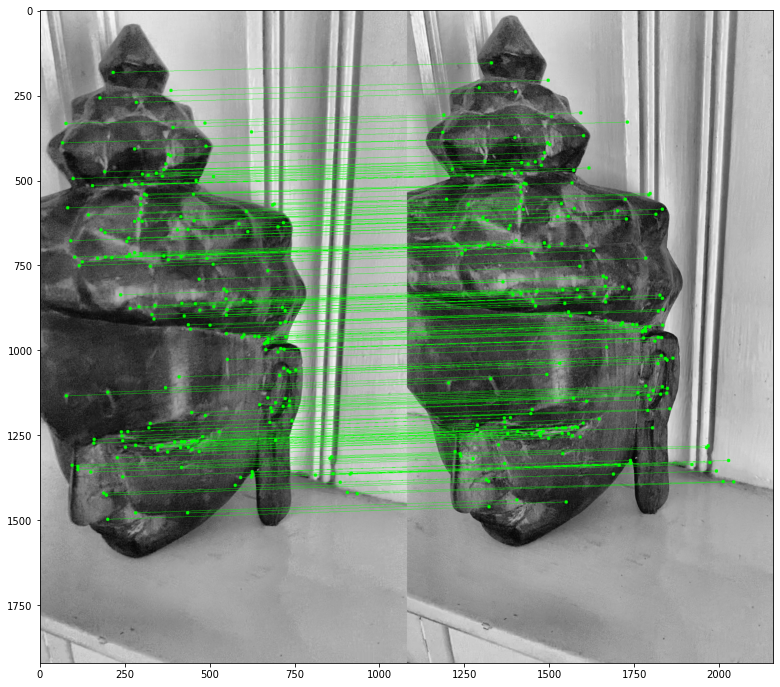

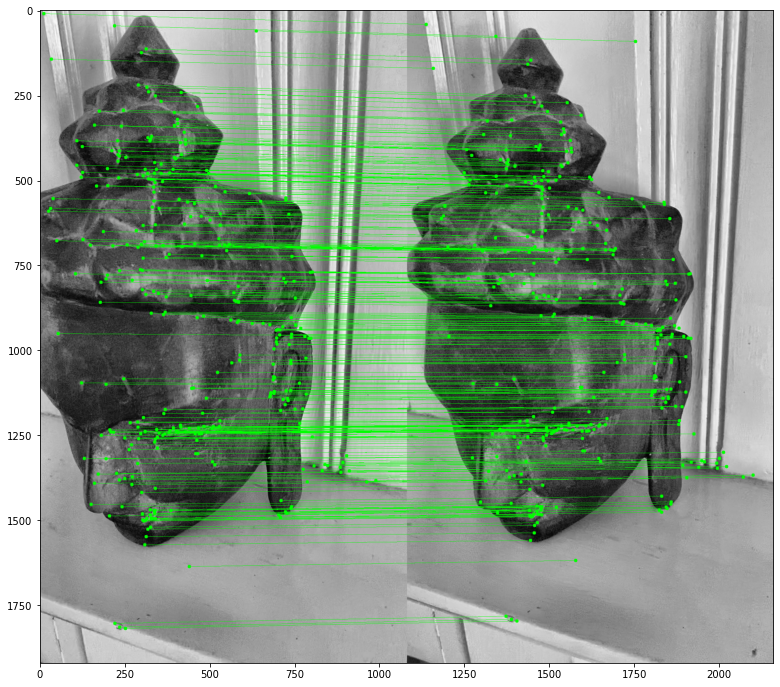

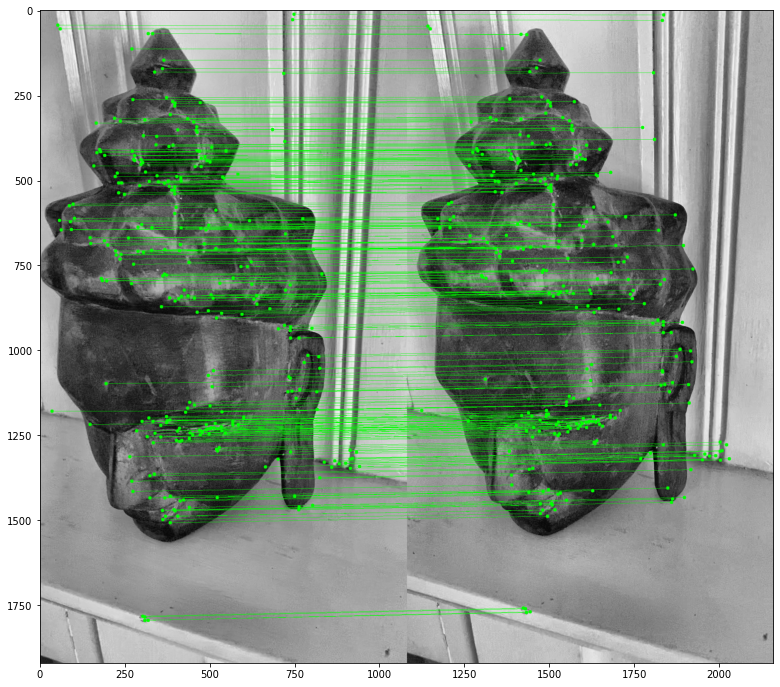

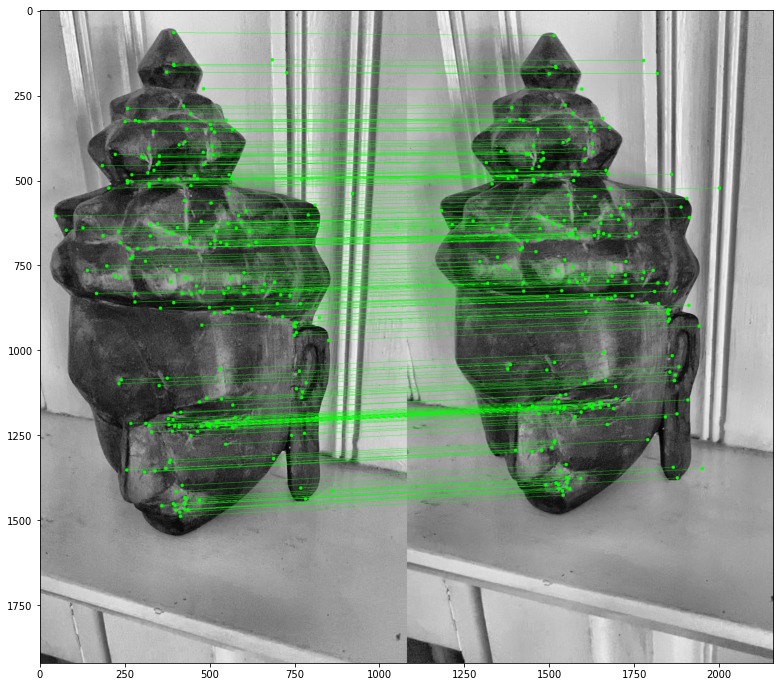

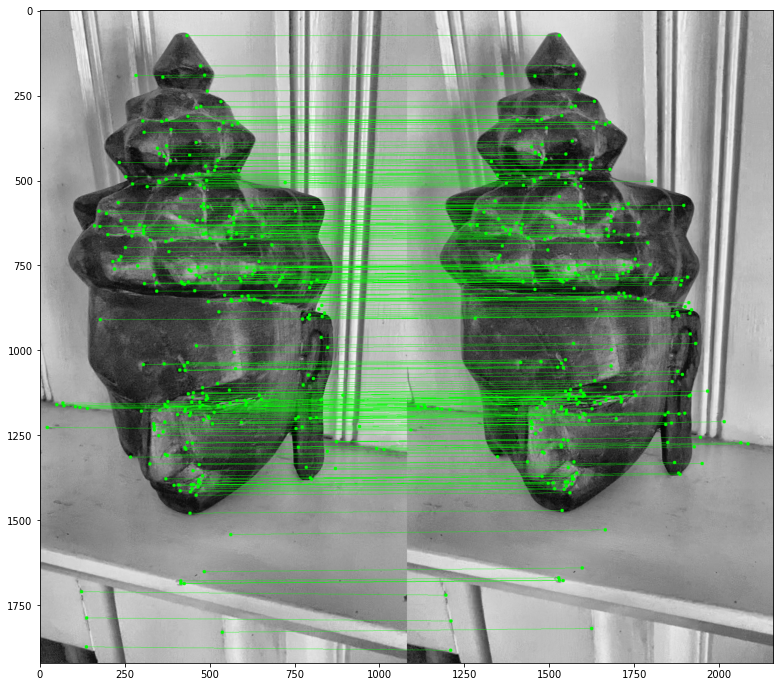

...

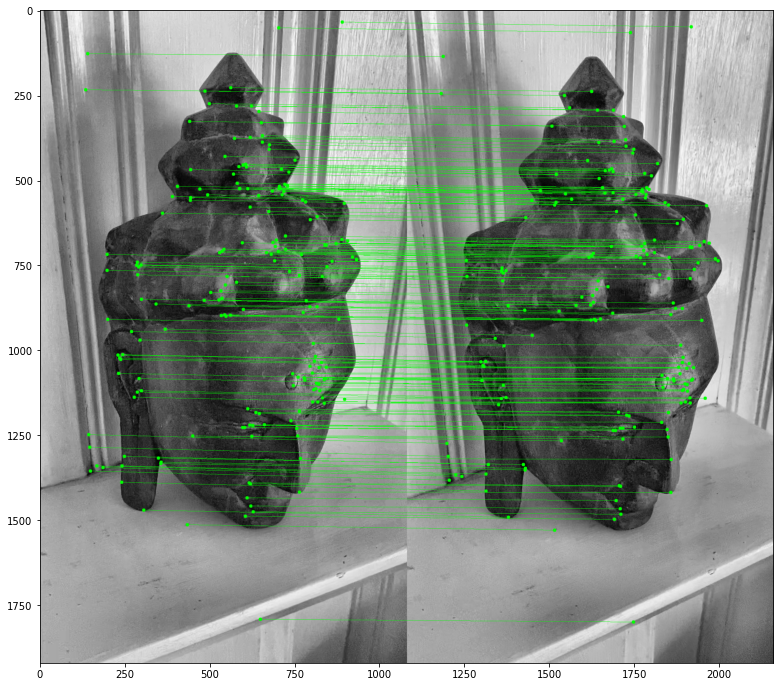

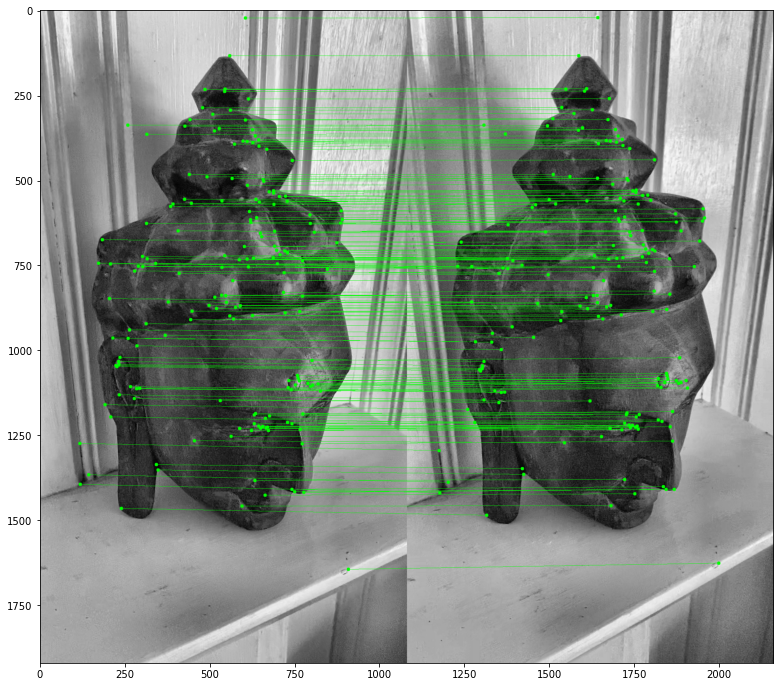

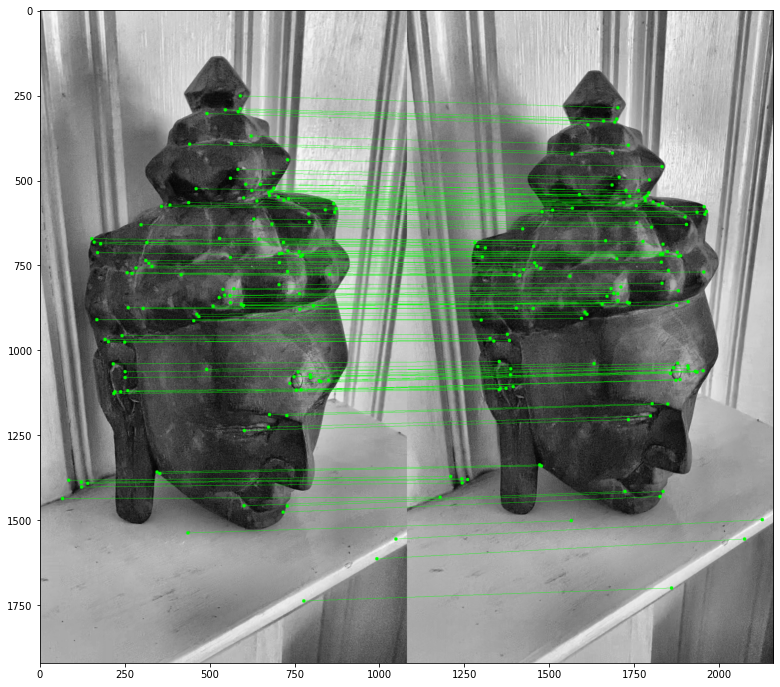

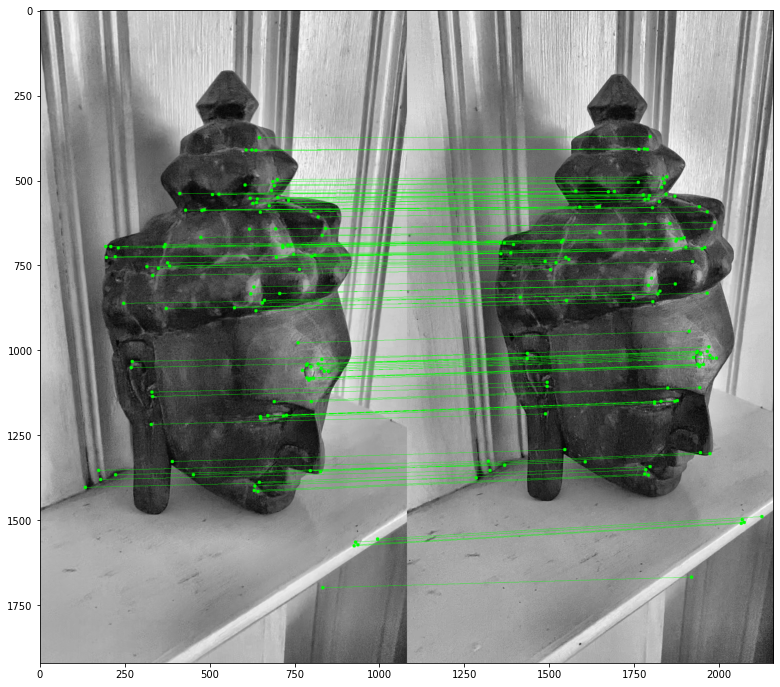

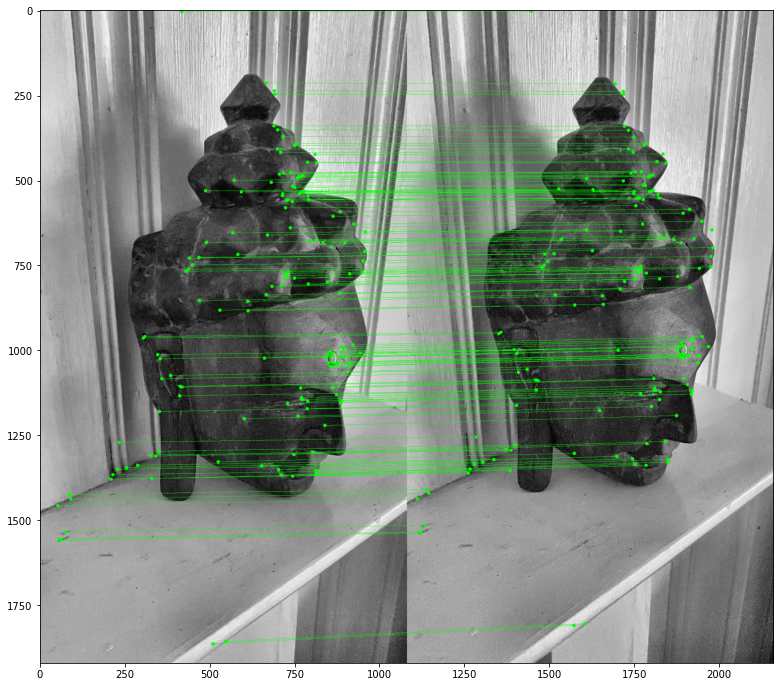

In [14]:
# Triangluate all the matching points and push into gtsam nonlinear factor graph
for src_index in range(1, len(image_list)-1):

    dst_index = src_index+1
    
    # Get matching points
    src_points, dst_points, src_point_index_list, dst_point_index_list = get_match_points(
        keypoints_list[src_index], descriptors_list[src_index], keypoints_list[dst_index], descriptors_list[dst_index])
    
    # Get rotation matrix and translation (not up to scale)
    rotation_matrix, translation, index_mask = get_rotation_translation_index_mask(
        dst_points, src_points)
    
    # Filter the matching points with RANSAC when finding essential matrix
    src_points = src_points[index_mask]
    dst_points = dst_points[index_mask]
    src_point_index_list = src_point_index_list[index_mask]
    dst_point_index_list = dst_point_index_list[index_mask]
    
    # Visulization
    utils.plot_match_points(
        image_list[src_index], image_list[dst_index], src_points, dst_points)
    
    # Get the transformation matrix relative to the first initial transformation (identity 4*4 matrix)
    # WITHOUT knowing the scale!!!
    transformation_matrix = get_transformation_matrix(
        rotation_matrix, translation).dot(prev_transformation_matrix)
    
    # Get projection matrix relative to the first initial projection
    # WITHOUT knowing the scale!!!
    projection_matrix = get_projection_matrix(transformation_matrix)
    
    match_src_points = []
    match_dst_points = []
    match_object_points = []

    src_object_index_array = object_index_list[src_index]
    dst_object_index_array = object_index_list[dst_index]
    src_bgr_image = bgr_image_list[src_index]
    dst_bgr_image = bgr_image_list[dst_index]
    
    # Find all matching points that exist as 3D points before
    for src_point, dst_point, src_point_index in zip(src_points, dst_points, src_point_index_list):

        object_index = src_object_index_array[src_point_index]
        if object_index != -1:
            match_src_points.append(src_point)
            match_dst_points.append(dst_point)
            match_object_points.append(
                sum_all_object_points[object_index]/(all_object_points_count[object_index]-1))

    match_src_points = np.array(match_src_points)
    match_dst_points = np.array(match_dst_points)
    match_object_points = np.array(match_object_points)
    
    # Use these existing 3D points to find the correct scale
    object_points = get_object_points(
        prev_projection_matrix, projection_matrix, match_src_points, match_dst_points)
    
    # Calculate the average scale of all matching 3D points
    scale = 0
    for match_object_point, object_point in zip(match_object_points, object_points):
        scale += cv2.norm(match_object_point)/cv2.norm(object_point)

    scale /= len(object_points)
    
    # translation is affected by the scale
    translation *= scale
    
    # Get the transformation matrix relative to the first initial transformation (identity 4*4 matrix) AGAIN
    # with the average scale
    transformation_matrix = get_transformation_matrix(
        rotation_matrix, translation).dot(prev_transformation_matrix)

    initial.insert(symbol_X(dst_index),
                   gtsam.Pose3(gtsam.Rot3(transformation_matrix[:3, :3]),
                               gtsam.Point3(transformation_matrix[:3, 3])))
    
    # Get the projection matrix relative to the first initial projection AGAIN
    # with the average scale
    projection_matrix = get_projection_matrix(transformation_matrix)

    object_points = get_object_points(
        prev_projection_matrix, projection_matrix, src_points, dst_points)
    
    # Cache the transformation and projection from the first pose to the current pose
    prev_transformation_matrix = transformation_matrix.copy()
    prev_projection_matrix = projection_matrix.copy()

    rint_src_points = utils.get_rint(src_points)
    rint_dst_points = utils.get_rint(dst_points)

    current_object_index = len(all_object_points_count)
    
    # Add all the measurement into factor graph
    for src_point, dst_point, src_point_index, dst_point_index, object_point, rint_src_point, rint_dst_point in zip(src_points,
                                                                                                                    dst_points,
                                                                                                                    src_point_index_list,
                                                                                                                    dst_point_index_list,
                                                                                                                    object_points,
                                                                                                                    rint_src_points,
                                                                                                                    rint_dst_points):
        object_index = src_object_index_array[src_point_index]
        
        # If the 3D point is newly detected, it has never appeared before
        if object_index == -1:

            object_index = current_object_index
            
            # Add new point to 3D point list
            sum_all_object_points.append(object_point)
            
            # Add new point to point color list
            sum_all_object_points_color.append(
                src_bgr_image[rint_src_point[1], rint_src_point[0]] + dst_bgr_image[rint_dst_point[1], rint_dst_point[0]])
            all_object_points_count.append(2)

            src_object_index_array[src_point_index] = dst_object_index_array[
                dst_point_index] = object_index

            current_object_index += 1
        # Else, the 3D point exists, find it by index
        else:
            dst_object_index_array[dst_point_index] = object_index
            
            # Cumulative the color of each 3D point
            sum_all_object_points[object_index] += object_point
            sum_all_object_points_color[object_index] += dst_bgr_image[rint_dst_point[1],
                                                                       rint_dst_point[0]]
            
            # Counter ++
            all_object_points_count[object_index] += 1
        
        # Each feature is measured by both src_camera and dst_camera, add measurement factor into graph
        graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
            src_point, measurement_noise, symbol_X(src_index), symbol_L(object_index), gtsam_camera_matrix))

        graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
            dst_point, measurement_noise, symbol_X(dst_index), symbol_L(object_index), gtsam_camera_matrix))

In [15]:
# Run global optimization on gtsam nonlinear factor graph
all_object_points_count = np.array(
    [all_object_points_count, all_object_points_count, all_object_points_count]).T

# Calculate the average color of each 3D point
all_object_points = np.array(sum_all_object_points)/(all_object_points_count-1)
all_object_points_color = np.flip(np.array(
    sum_all_object_points_color)/all_object_points_count).astype(np.uint8)

for object_index, object_point in enumerate(all_object_points):
    initial.insert(symbol_L(object_index),
                   gtsam.Point3(object_point))

params = gtsam.LevenbergMarquardtParams()
optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial, params)
result = optimizer.optimize()

<IPython.core.display.Javascript object>


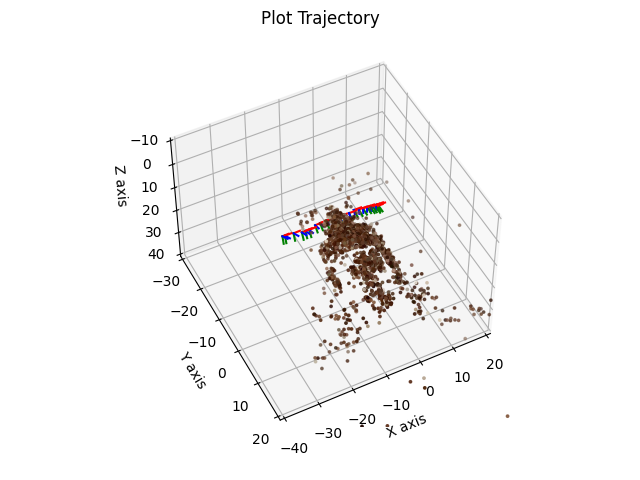

In [16]:
# Visulation
%matplotlib notebook

fig = plt.figure()
ax = fig.gca(projection='3d')

final_object_points = []
for index in range(len(all_object_points)):
    final_object_points.append(result.atPoint3(symbol_L(index)))

final_object_points = np.array(final_object_points)

ax.scatter(final_object_points[:, 0],
           final_object_points[:, 1], final_object_points[:, 2], c=all_object_points_color/255., s=3)

gtsam.utils.plot.plot_trajectory(1, result, scale=2)
gtsam.utils.plot.set_axes_equal(1)

ax.set_xlim3d(-40, 20)
ax.set_ylim3d(-30, 20)
ax.set_zlim3d(-10, 40)


plt.show()